In [1]:
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt
sb.set()

In [2]:
# Import datasets
data = pd.read_csv('os.csv')
data.head()

,Unnamed: 0,CustomerID,Gender,Location,Tenure_Months,Transaction_ID,Transaction_Date,Product_SKU,Product_Description,Product_Category,...,Avg_Price,Delivery_Charges,Coupon_Status,GST,Date,Offline_Spend,Online_Spend,Month,Coupon_Code,Discount_pct
0,0,17850.0,M,Chicago,12.0,16679.0,2019-01-01,GGOENEBJ079499,Nest Learning Thermostat 3rd Gen-USA - Stainle...,Nest-USA,...,153.71,6.5,Used,0.1,1/1/2019,4500.0,2424.5,1,ELEC10,10.0
1,1,17850.0,M,Chicago,12.0,16680.0,2019-01-01,GGOENEBJ079499,Nest Learning Thermostat 3rd Gen-USA - Stainle...,Nest-USA,...,153.71,6.5,Used,0.1,1/1/2019,4500.0,2424.5,1,ELEC10,10.0
2,2,17850.0,M,Chicago,12.0,16696.0,2019-01-01,GGOENEBQ078999,Nest Cam Outdoor Security Camera - USA,Nest-USA,...,122.77,6.5,Not Used,0.1,1/1/2019,4500.0,2424.5,1,ELEC10,10.0
3,3,17850.0,M,Chicago,12.0,16699.0,2019-01-01,GGOENEBQ079099,Nest Protect Smoke + CO White Battery Alarm-USA,Nest-USA,...,81.50,6.5,Clicked,0.1,1/1/2019,4500.0,2424.5,1,ELEC10,10.0
4,4,17850.0,M,Chicago,12.0,16700.0,2019-01-01,GGOENEBJ079499,Nest Learning Thermostat 3rd Gen-USA - Stainle...,Nest-USA,...,153.71,6.5,Clicked,0.1,1/1/2019,4500.0,2424.5,1,ELEC10,10.0


In [4]:
df = pd.DataFrame(data)
rows = df.shape[0] # Get number of rows
columns = df.shape[1] # Get number of columns
print(rows, columns)

52955 21


In [5]:
df.describe()

,Unnamed: 0,CustomerID,Tenure_Months,Transaction_ID,Quantity,Avg_Price,Delivery_Charges,GST,Offline_Spend,Online_Spend,Month,Discount_pct
count,52955.000000,52924.00000,52924.000000,52924.000000,52924.000000,52924.000000,52924.000000,52924.000000,52924.000000,52924.000000,52955.000000,52555.000000
mean,26477.000000,15346.70981,26.127995,32409.825675,4.497638,52.237646,10.517630,0.137462,2830.914141,1893.109119,6.652800,19.953382
std,15286.936089,1766.55602,13.478285,8648.668977,20.104711,64.006882,19.475613,0.045825,936.154247,807.014092,3.333664,8.127108
min,0.000000,12346.00000,2.000000,16679.000000,1.000000,0.390000,0.000000,0.050000,500.000000,320.250000,1.000000,10.000000
25%,13238.500000,13869.00000,15.000000,25384.000000,1.000000,5.700000,6.000000,0.100000,2500.000000,1252.630000,4.000000,10.000000
50%,26477.000000,15311.00000,27.000000,32625.500000,1.000000,16.990000,6.000000,0.180000,3000.000000,1837.870000,7.000000,20.000000
75%,39715.500000,16996.25000,37.000000,39126.250000,2.000000,102.130000,6.500000,0.180000,3500.000000,2425.350000,9.000000,30.000000
max,52954.000000,18283.00000,50.000000,48497.000000,900.000000,355.740000,521.360000,0.180000,5000.000000,4556.930000,12.000000,30.000000


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52955 entries, 0 to 52954
Data columns (total 21 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Unnamed: 0           52955 non-null  int64  
 1   CustomerID           52924 non-null  float64
 2   Gender               52924 non-null  object 
 3   Location             52924 non-null  object 
 4   Tenure_Months        52924 non-null  float64
 5   Transaction_ID       52924 non-null  float64
 6   Transaction_Date     52924 non-null  object 
 7   Product_SKU          52924 non-null  object 
 8   Product_Description  52924 non-null  object 
 9   Product_Category     52955 non-null  object 
 10  Quantity             52924 non-null  float64
 11  Avg_Price            52924 non-null  float64
 12  Delivery_Charges     52924 non-null  float64
 13  Coupon_Status        52924 non-null  object 
 14  GST                  52924 non-null  float64
 15  Date                 52924 non-null 

In [7]:
print("Data type : ", type(data))
print("Data dims : ", data.shape)
print(data.dtypes)

Data type :  <class 'pandas.core.frame.DataFrame'>
Data dims :  (52955, 21)
Unnamed: 0               int64
CustomerID             float64
Gender                  object
Location                object
Tenure_Months          float64
Transaction_ID         float64
Transaction_Date        object
Product_SKU             object
Product_Description     object
Product_Category        object
Quantity               float64
Avg_Price              float64
Delivery_Charges       float64
Coupon_Status           object
GST                    float64
Date                    object
Offline_Spend          float64
Online_Spend           float64
Month                    int64
Coupon_Code             object
Discount_pct           float64
dtype: object


Draw out month graph, against offline and online spend see which month has more online to offline spend

# The conclusion we want to talk about?

In [38]:
offline = pd.DataFrame(data['Offline_Spend'])
online = pd.DataFrame(data['Online_Spend'])
mnth=pd.DataFrame(data['Month'])
spendings = pd.concat([offline, online], axis=1)
spendings

,Offline_Spend,Online_Spend
0,4500.0,2424.5
1,4500.0,2424.5
2,4500.0,2424.5
3,4500.0,2424.5
4,4500.0,2424.5
...,...,...
52950,NaN,NaN
52951,NaN,NaN
52952,NaN,NaN
52953,NaN,NaN


In [21]:
#Drop empty columns
spendings.dropna(axis=0)

,Offline_Spend,Online_Spend
0,4500.0,2424.50
1,4500.0,2424.50
2,4500.0,2424.50
3,4500.0,2424.50
4,4500.0,2424.50
...,...,...
52919,2500.0,1294.22
52920,2000.0,1066.12
52921,3000.0,2230.76
52922,3000.0,2230.76


In [25]:
spendings.describe()

,Offline_Spend,Online_Spend
count,52924.000000,52924.000000
mean,2830.914141,1893.109119
std,936.154247,807.014092
min,500.000000,320.250000
25%,2500.000000,1252.630000
50%,3000.000000,1837.870000
75%,3500.000000,2425.350000
max,5000.000000,4556.930000


<Axes: ylabel='Count'>

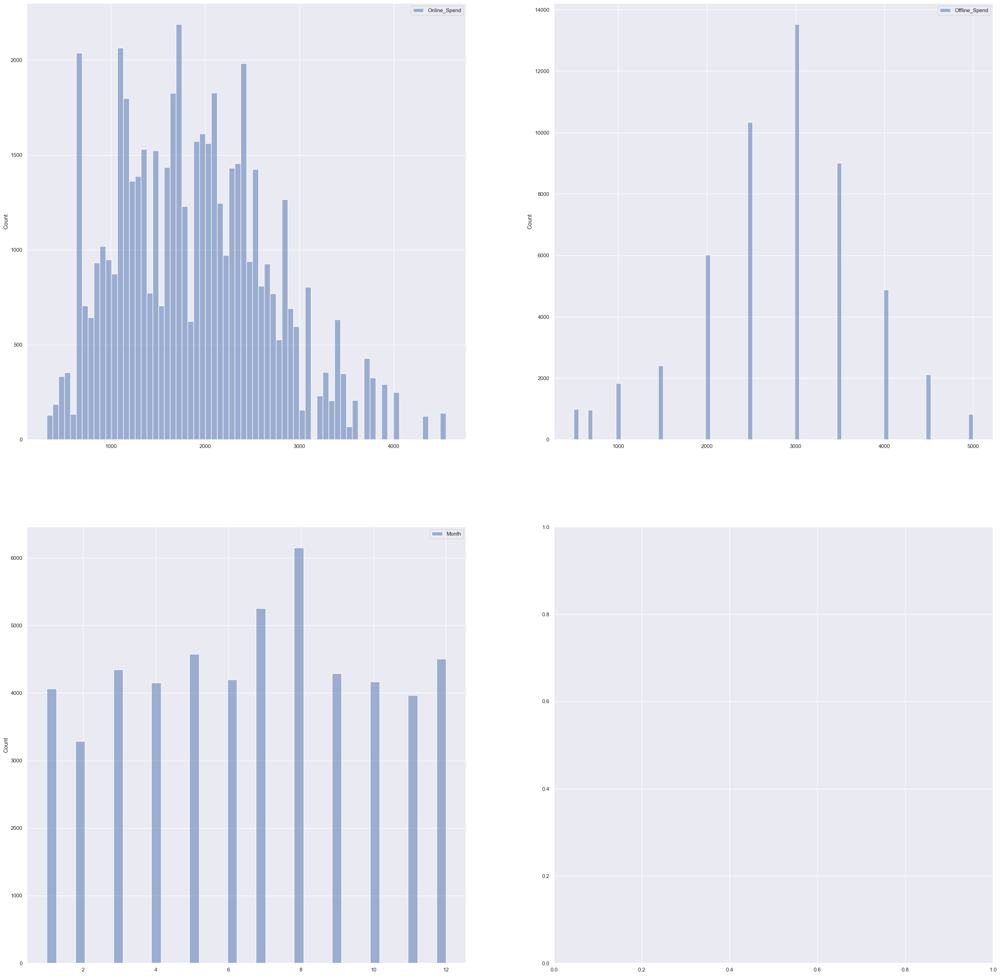

In [44]:
f, axes = plt.subplots(2, 2, figsize=(36, 36))
sb.histplot(data = online,ax = axes[0,0])
sb.histplot(data= offline,ax = axes[0,1])
sb.histplot(data = mnth, ax = axes[1,0])

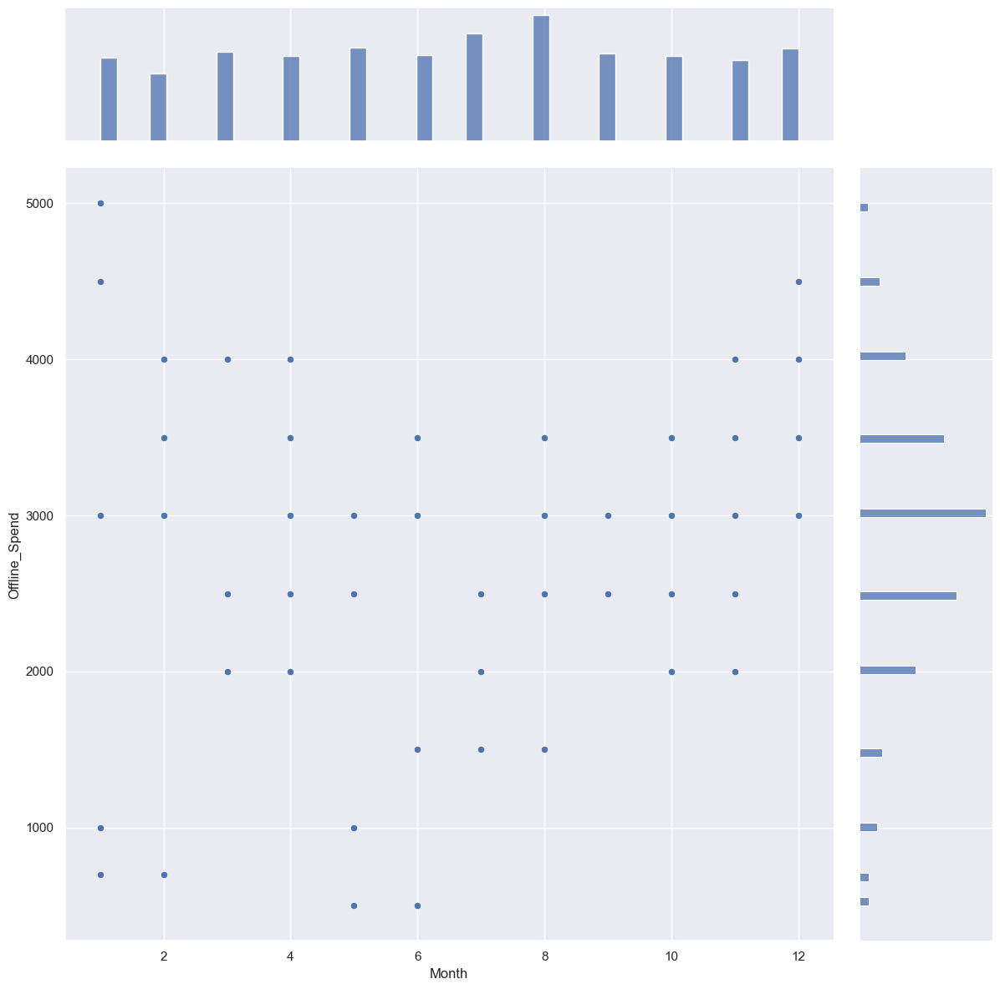

In [34]:
#leave this first testing graph
offlinemnth=pd.concat([offline, mnth], axis=1)
onlinemnth=pd.concat([online, mnth], axis=1)
sb.jointplot(data = offlinemnth, x = "Month", y = "Offline_Spend", height = 12)

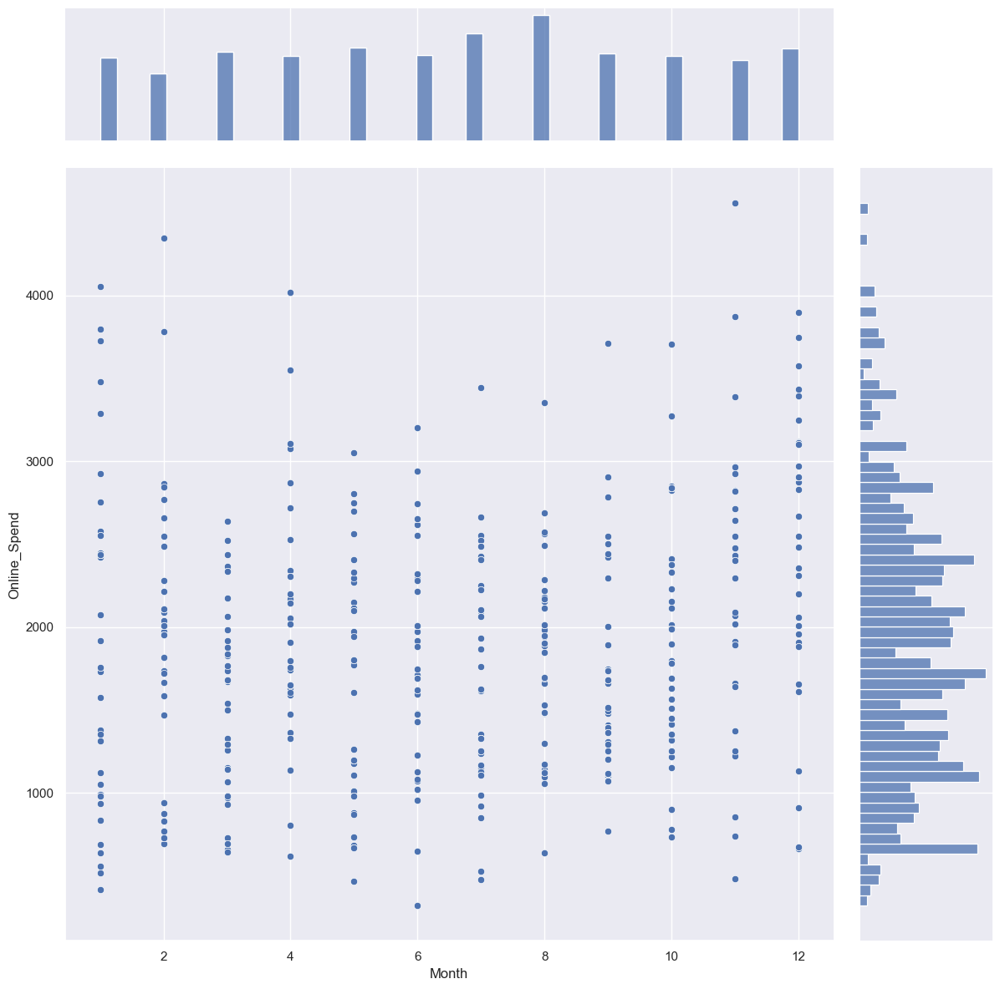

In [35]:
sb.jointplot(data = onlinemnth, x = "Month", y = "Online_Spend", height = 12)

# Grouping data and checking relationships with type of spendings? (This can be changed if wanna talk about something else)

## Filter based on Gender

In [36]:
gender_count = df['Gender'].value_counts() # Sum of occurrence for each unique value
gender_count

Gender
F    33007
M    19917
Name: count, dtype: int64

In [37]:
# This one printing same gender
gender = pd.DataFrame(data['Gender'])

for i in range(len(gender)):
    print(gender)


      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...
52950    NaN
52951    NaN
52952    NaN
52953    NaN
52954    NaN

[52955 rows x 1 columns]
      Gender
0          M
1          M
2          M
3          M
4          M
...      ...

## Linear regression using random train-test split modal for both online and offline separately

In [ ]:
# Import required libraries
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

In [68]:
online = pd.DataFrame(data['Online_Spend'])

Gender_train, Gender_test, Online_train, Online_test = train_test_split(gender, online, test_size = 0.2)

linreg = LinearRegression()
linreg.fit(Gender_train, Online_train)

print('Intercept of Regression \t: b = ', linreg.intercept_)
print('Coefficients of Regression \t: a = ', linreg.coef_)
print()

ValueError: could not convert string to float: 'F'

In [67]:
offline = pd.DataFrame(data['Offline_Spend'])

Gender_train, Gender_test, Offline_train, Offline_test = train_test_split(gender, online, test_size = 0.2)

linreg = LinearRegression()
linreg.fit(Gender_train, Offline_train)

print('Intercept of Regression \t: b = ', linreg.intercept_)
print('Coefficients of Regression \t: a = ', linreg.coef_)
print()

ValueError: could not convert string to float: 'M'

## Filter based on Location

In [34]:
location = df['Location'].value_counts() # Sum of occurrence for each unique value
location

Location
Chicago          18380
California       16136
New York         11173
New Jersey        4503
Washington DC     2732
Name: count, dtype: int64